In [69]:
import os
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

In [72]:
def draw_homography(img1, img2, matches, kp1, kp2):
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in matches ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)
    M, mask = cv.findHomography(src_pts, dst_pts, cv.RANSAC, 5.0)
    if M is not None:
        h,w = img1.shape
        pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
        dst = cv.perspectiveTransform(pts, M)
        return cv.polylines(img2, [np.int32(dst)], True, 255, 10, cv.LINE_AA)
    else:
        print("Homography could not be found.")
        return img2

def _find_matching_features(img1, img2):
    sift = cv.xfeatures2d.SIFT_create()
    
    kp1, des1 = sift.detectAndCompute(img1,None)
    kp2, des2 = sift.detectAndCompute(img2,None)
    
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    
    flann = cv.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(des1,des2,k=2)
    
    good = []
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            good.append(m)
    return good, kp1, kp2

def find_matching_features(img1, img2):
    orb = cv.ORB_create()

    kp1, des1 = orb.detectAndCompute(img1,None)
    kp2, des2 = orb.detectAndCompute(img2,None)
    
    bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key = lambda x:x.distance)
    return matches, kp1, kp2
    
def find_image(img1, img2):
    matches, kp1, kp2 = _find_matching_features(img1, img2)

    if len(matches) < 10:
        print('too few good points')
        return False
    else:
        img_keyponits = cv.drawKeypoints(img2, kp2, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        plt.imshow(img_keyponits)
        plt.show()

        img2 = draw_homography(img1, img2, matches, kp1, kp2)
        n=30
        img3 = cv.drawMatches(img1,kp1,img2,kp2,matches[:n],None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        plt.imshow(img3)
        plt.show()       
        return True
  

In [67]:
def draw_rect(img, points):
    rect = cv.minAreaRect(points)
    box_points = cv.boxPoints(rect)
    box_points = np.intp(box_points)
    return cv.drawContours(img, [box_points], 0, 255, 5)
    
def find_multi_image(img1, img2):
    h, w = img1.shape
    
    orb = cv.ORB_create(
        nfeatures=1000,         # Find more features in the scene
        scaleFactor=1.1,        # Use a finer scale pyramid, better for small variations
        patchSize=21,           # Size of the patch used by the BRIEF descriptor. Default is 31.
        fastThreshold=10,       # Lower threshold makes FAST more sensitive. Default is 20.
        WTA_K=4                 # Use 4 points to produce the descriptor instead of 2. More robust.
    )
    kp1, des1 = orb.detectAndCompute(img1,None)
    kp2, des2 = orb.detectAndCompute(img2,None)

    img_keyponits = cv.drawKeypoints(img2, kp2, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.imshow(img_keyponits)
    plt.show()

    all_points_img2 = np.float32([kp.pt for kp in kp2])
    MIN_CLUSTER_SIZE = 5
    EPSILON_DISTANCE = 15

    db = DBSCAN(eps=EPSILON_DISTANCE, min_samples=MIN_CLUSTER_SIZE).fit(all_points_img2)
    labels = db.labels_

    unique_labels = set(labels)
    num_clusters = len(unique_labels) - (1 if -1 in labels else 0)
    print(f"DBSCAN found {num_clusters} potential character clusters.")
    img_output = img2.copy()

    for cluster_label in unique_labels:
        print(f'Cluster {cluster_label}')

        if cluster_label == -1:
            continue
        cluster_indices = np.where(labels == cluster_label)[0]
        cluster_kp =  np.array(kp2)[cluster_indices]
        cluster_des =  np.array(des2)[cluster_indices]
        
        bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
        matches = bf.match(des1, cluster_des)
        matches = sorted(matches, key = lambda x:x.distance)
        if len(matches) > 4: 
            img_keyponits = cv.drawKeypoints(img2, cluster_kp, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
            # plt.imshow(draw_homography(img1, img_keyponits, matches, kp1, cluster_kp))
            cluster_points = np.float32([ cluster_kp[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)
            plt.imshow(draw_rect(img_keyponits, cluster_points))
            plt.show()
            img_output = draw_rect(img_output, cluster_points)
        else:
            print("Too few good matches")
            

    plt.imshow(img_output)
    plt.show()

def find_multi_image_sift(img1, img2):
    h, w = img1.shape
    
    sift = cv.SIFT_create(
        nfeatures=0,             # Keep all features
        nOctaveLayers=3,         # Default
        contrastThreshold=0.08,  # Lowered from 0.04 to find weaker features
        edgeThreshold=5,        # Increased from 10 to be more lenient on edges
        sigma=1.6                # Default
    )
    kp1, des1 = sift.detectAndCompute(img1,None)
    kp2, des2 = sift.detectAndCompute(img2,None)

    img_keyponits = cv.drawKeypoints(img2, kp2, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.imshow(img_keyponits)
    plt.show()

    all_points_img2 = np.float32([kp.pt for kp in kp2])
    MIN_CLUSTER_SIZE = 5
    EPSILON_DISTANCE = 20

    db = DBSCAN(eps=EPSILON_DISTANCE, min_samples=MIN_CLUSTER_SIZE).fit(all_points_img2)
    labels = db.labels_

    unique_labels = set(labels)
    num_clusters = len(unique_labels) - (1 if -1 in labels else 0)
    print(f"DBSCAN found {num_clusters} potential character clusters.")
    img_output = img2.copy()

    for cluster_label in unique_labels:
        print(f'Cluster {cluster_label}')

        if cluster_label == -1:
            continue
        
        cluster_indices = np.where(labels == cluster_label)[0]
        cluster_kp =  np.array(kp2)[cluster_indices]
        cluster_des =  np.array(des2)[cluster_indices]
        
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50)
        
        flann = cv.FlannBasedMatcher(index_params, search_params)
        matches = flann.knnMatch(des1,cluster_des,k=2)
        
        good = []
        for m,n in matches:
            if m.distance < 0.75*n.distance:
                good.append(m)

        if len(good) > 4: 
            img_keyponits = cv.drawKeypoints(img2, cluster_kp, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
            cluster_points = np.float32([ cluster_kp[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
            plt.imshow(draw_rect(img_keyponits, cluster_points))
            plt.show()
            img_output = draw_rect(img_output, cluster_points)
        else:
            print("Too few good matches")
            

    plt.imshow(img_output)
    plt.show()

(175, 400)


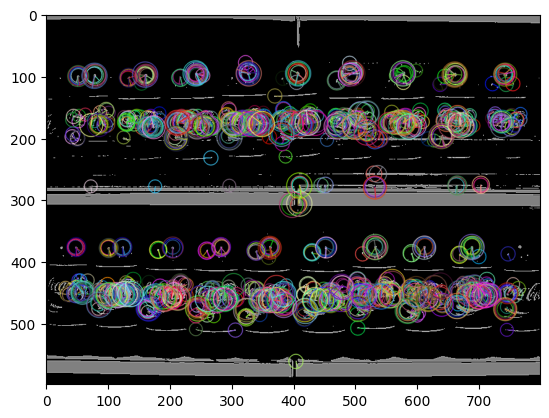

DBSCAN found 45 potential character clusters.
Cluster 0


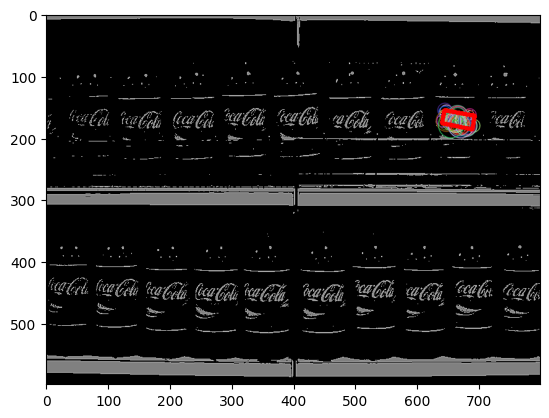

Cluster 1


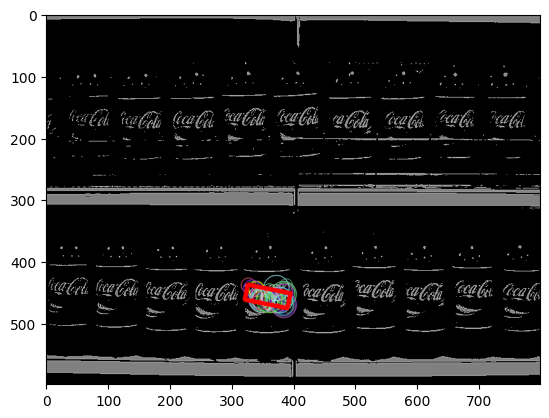

Cluster 2


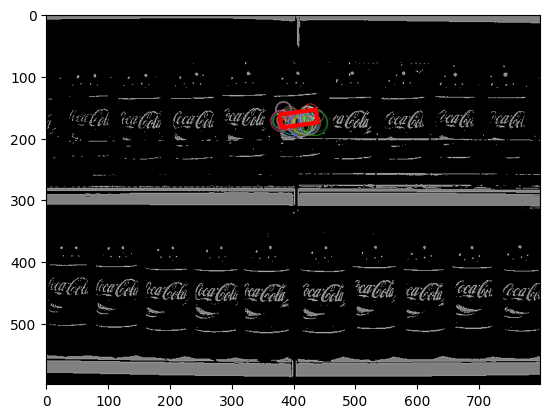

Cluster 3


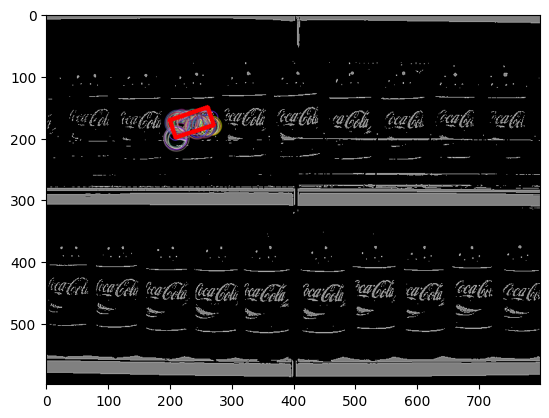

Cluster 4


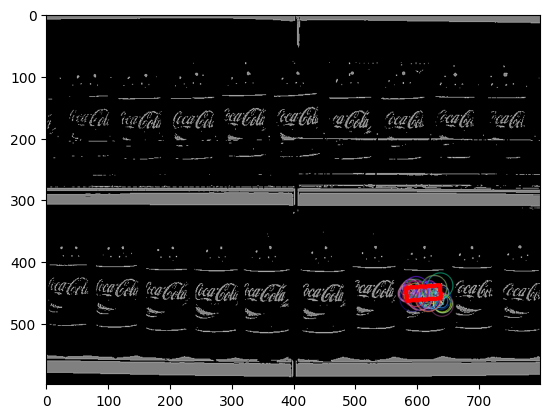

Cluster 5


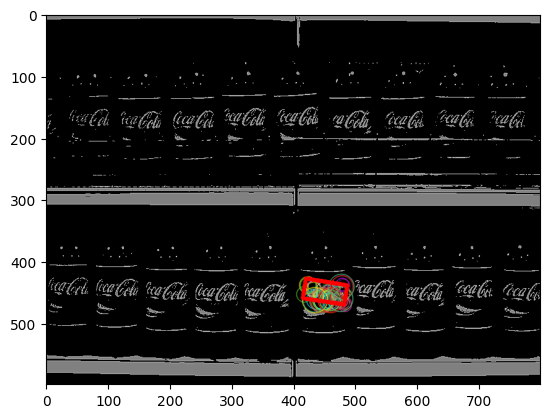

Cluster 6


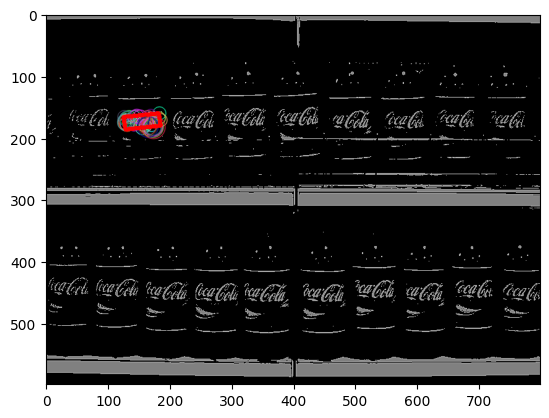

Cluster 7


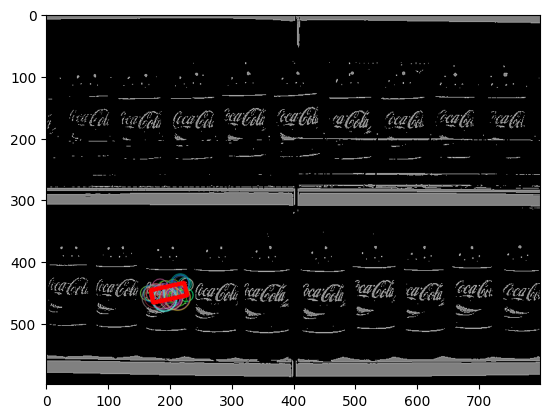

Cluster 8


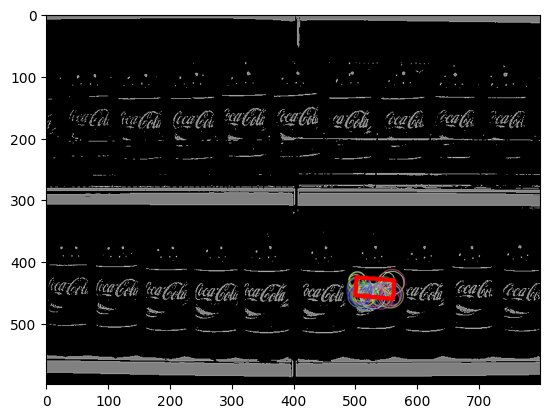

Cluster 9


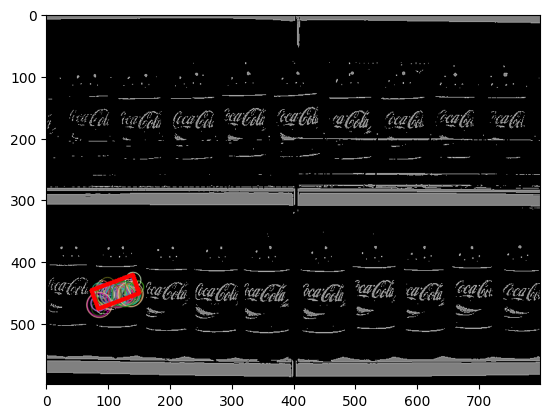

Cluster 10


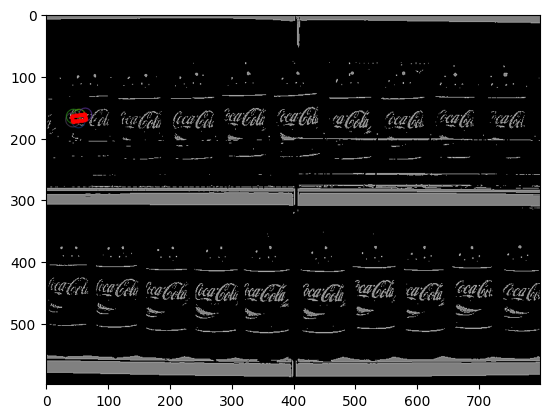

Cluster 11


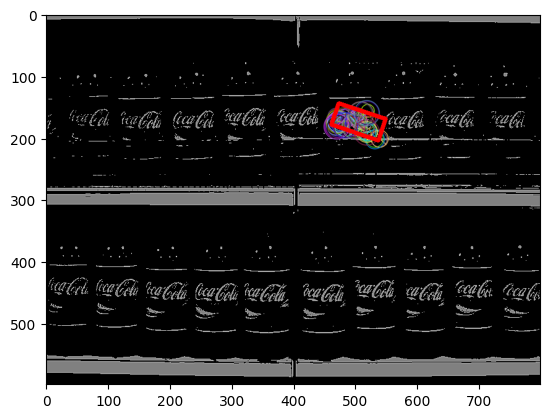

Cluster 12


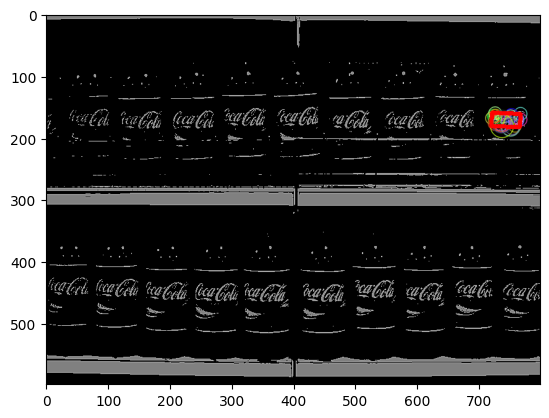

Cluster 13
Too few good matches
Cluster 14


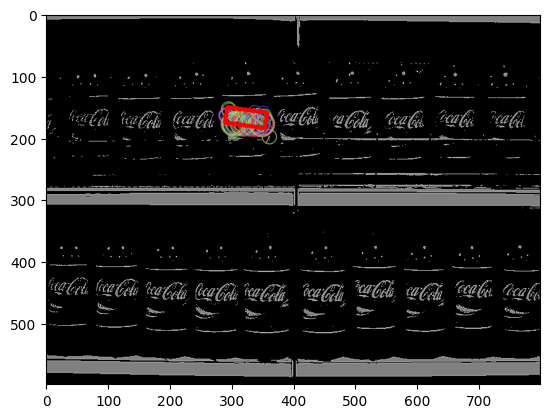

Cluster 15


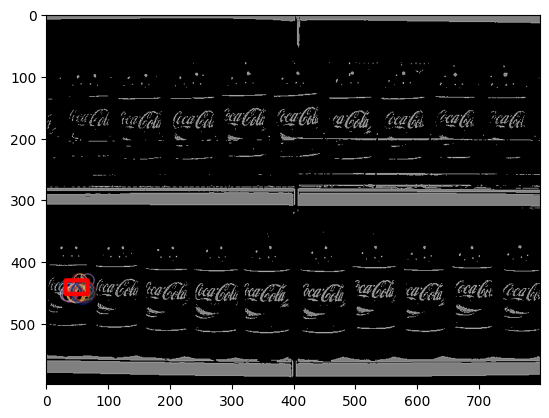

Cluster 16


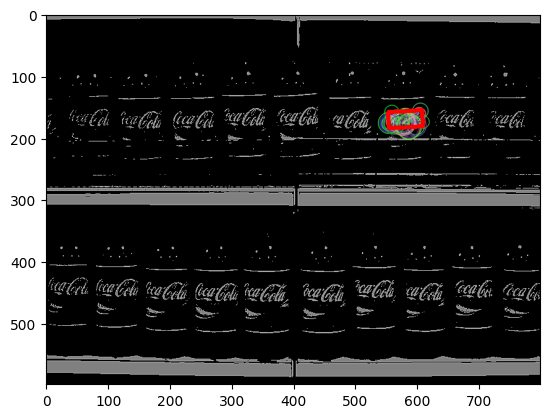

Cluster 17


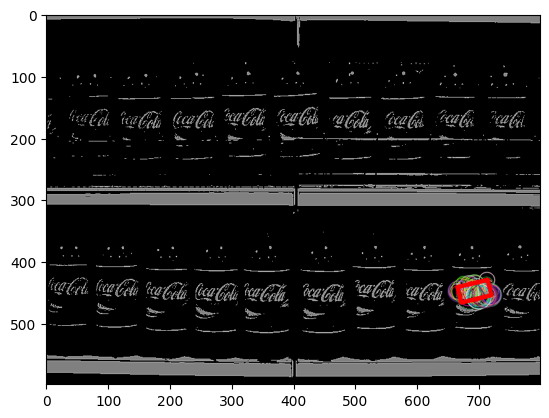

Cluster 18


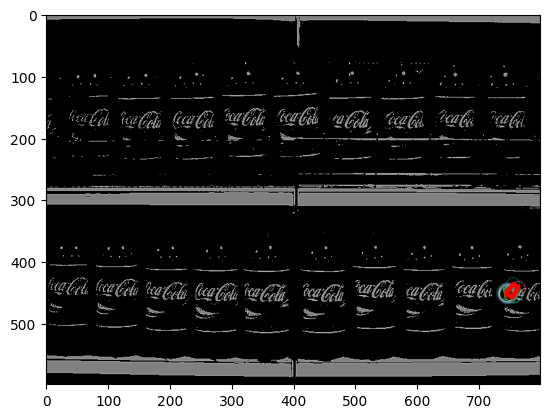

Cluster 19
Too few good matches
Cluster 20
Too few good matches
Cluster 21


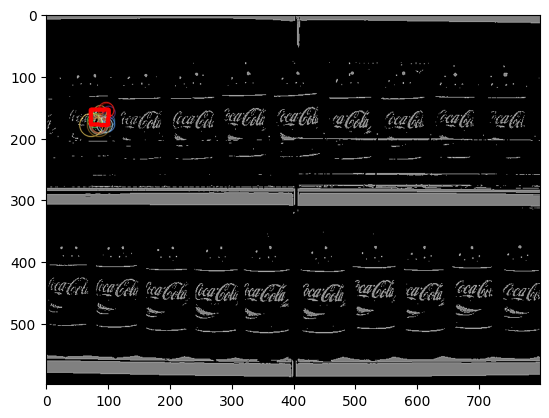

Cluster 22


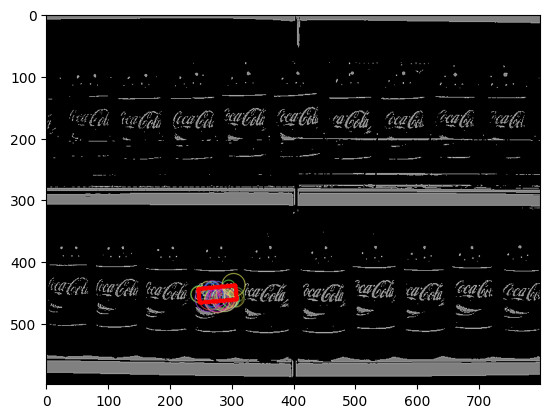

Cluster 23
Too few good matches
Cluster 24


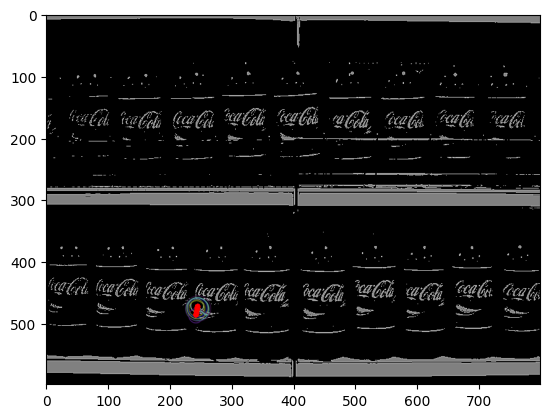

Cluster 25


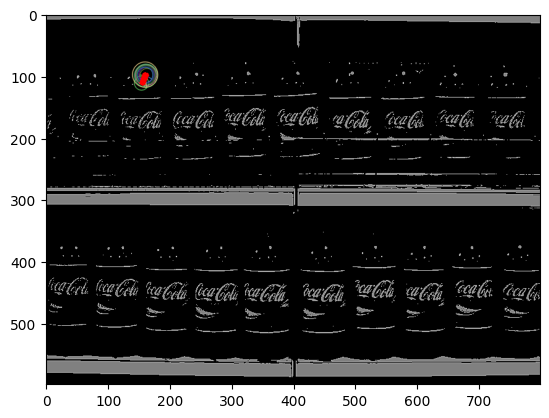

Cluster 26
Too few good matches
Cluster 27


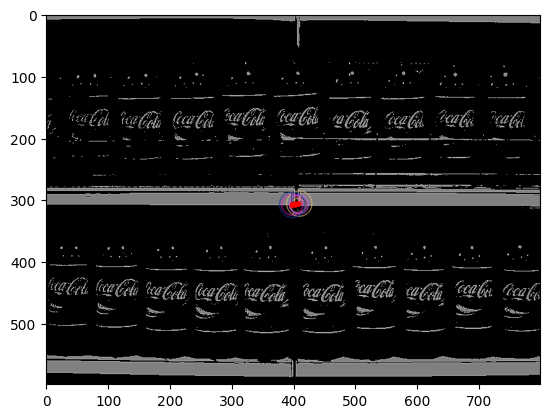

Cluster 28


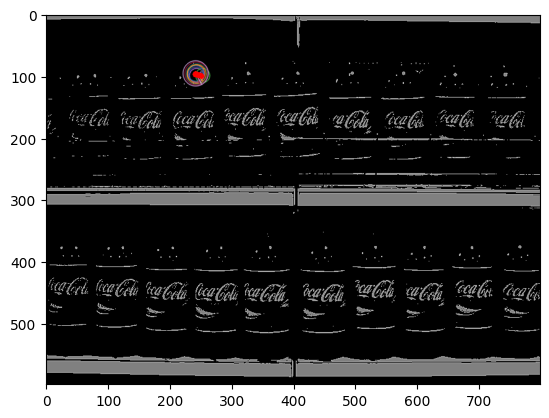

Cluster 29


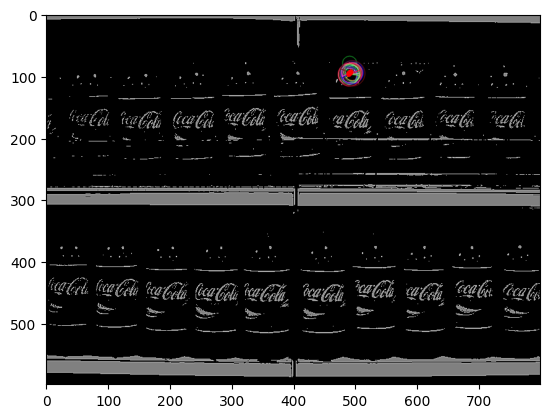

Cluster 30


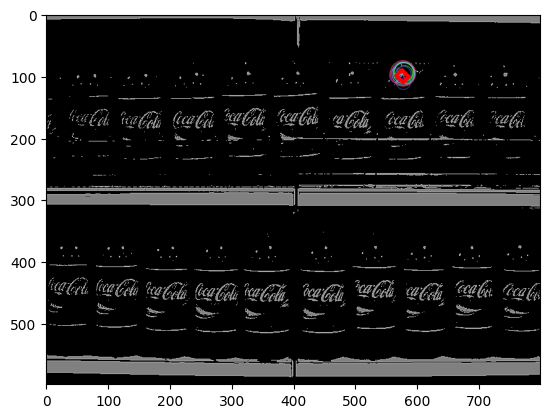

Cluster 31


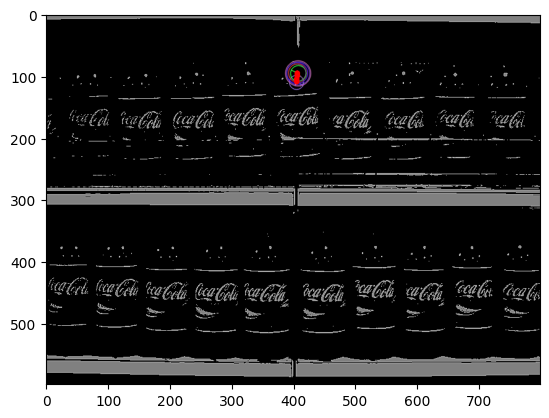

Cluster 32
Too few good matches
Cluster 33
Too few good matches
Cluster 34
Too few good matches
Cluster 35


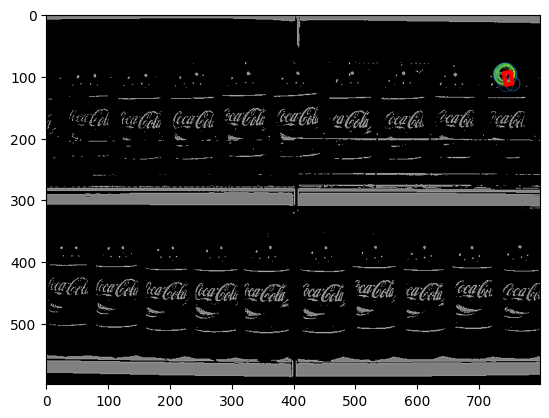

Cluster 36


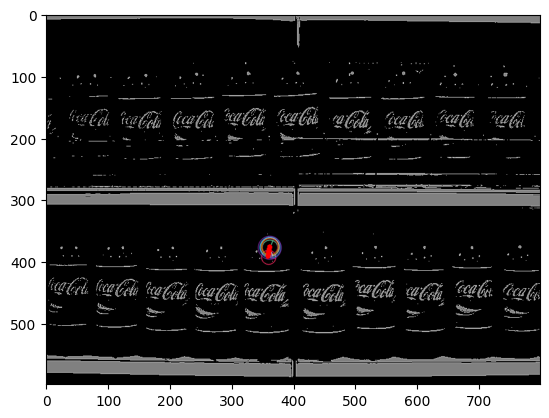

Cluster 37


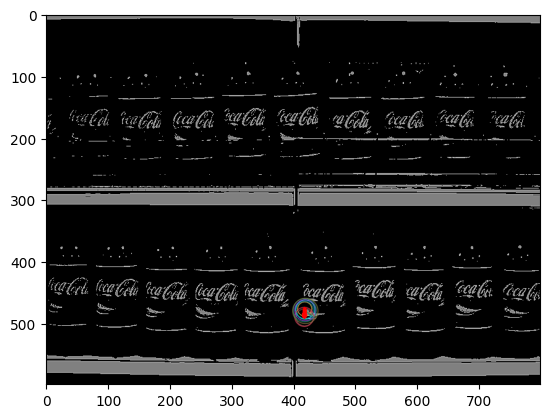

Cluster 38


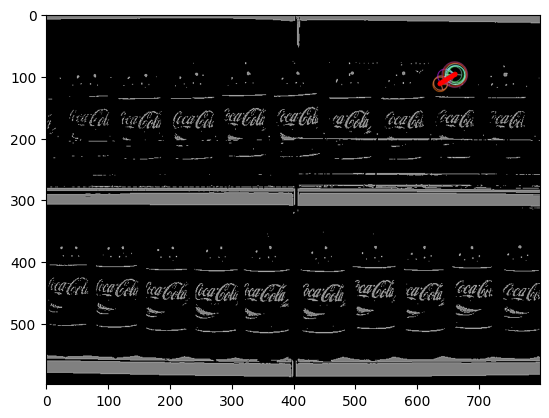

Cluster 39


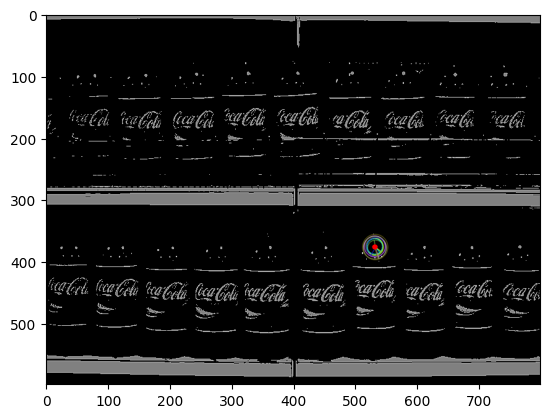

Cluster 40


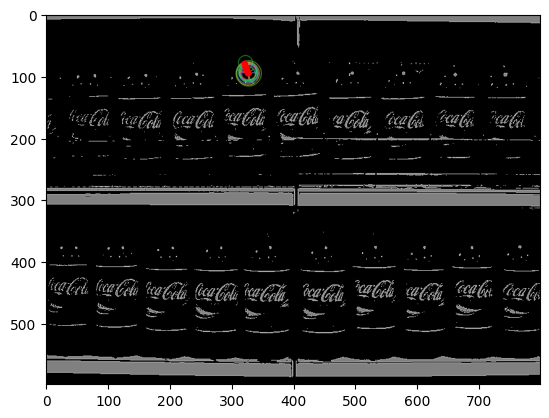

Cluster 41


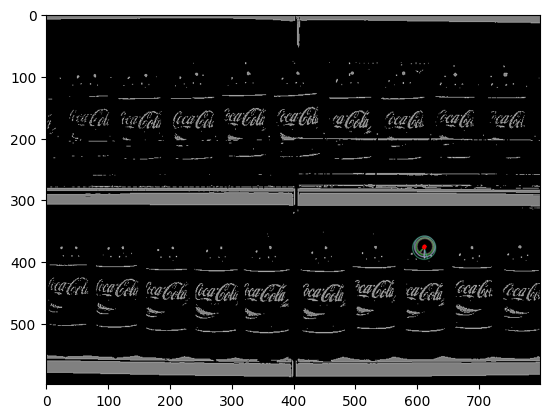

Cluster 42


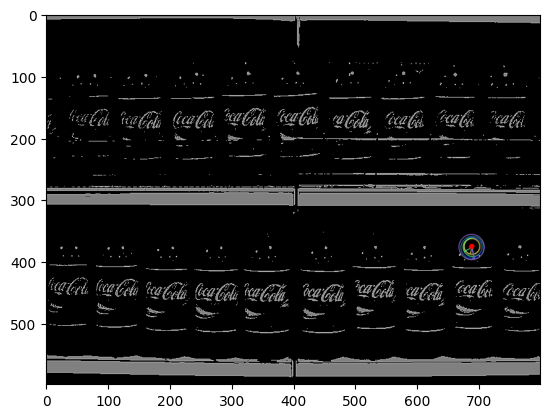

Cluster 43
Too few good matches
Cluster 44
Too few good matches
Cluster -1


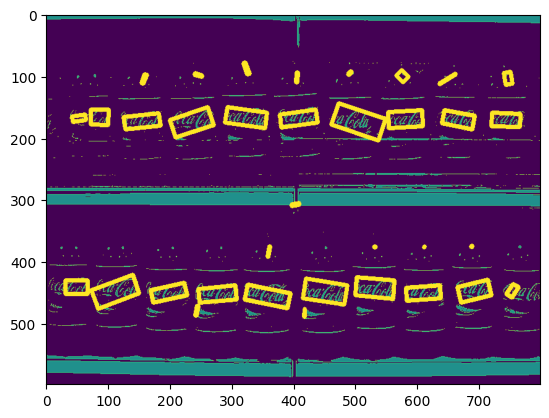

In [64]:
def apply_clahe(img):
    clahe = cv.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return clahe.apply(img)

def sharpenning(img):
    blurred = cv.GaussianBlur(img, (5, 5), 0)
    return cv.addWeighted(img, 1, blurred, -.5, 0)

# Cargamos la imagen a buscar
img1 = cv.bitwise_not(cv.imread('./template/pattern.png', cv.IMREAD_GRAYSCALE))
img1 = cv.threshold(img1, 50, 255, cv.THRESH_BINARY)[1]
# img1 = cv.bitwise_not(img1)
print(img1.shape)
img2 = cv.imread('./images/coca_multi.png', cv.IMREAD_GRAYSCALE)

img2 = cv.imread('./images/coca_multi.png', cv.IMREAD_GRAYSCALE)
img2 = cv.threshold(img2, 210, 255, cv.THRESH_BINARY)[1]

blurred = cv.GaussianBlur(img2, (3, 3), 0)
adaptive_thresh = cv.adaptiveThreshold(
    blurred, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv.THRESH_BINARY_INV, 11, 2
)
kernel = np.ones((2,2), np.uint8)
cleaned_image = cv.morphologyEx(adaptive_thresh, cv.MORPH_OPEN, kernel)


# find_image(cv.threshold(img1, 50, 255, cv.THRESH_BINARY)[1], img2[:300,:110])
# find_image(cv.threshold(img1, 50, 255, cv.THRESH_BINARY)[1], img2[:300,:410])
# find_image(img1, img2)
find_multi_image(img1, sharpenning(img2))
# find_multi_image(img1, cleaned_image)
# find_multi_image(img1, cv.bitwise_not(cleaned_image))

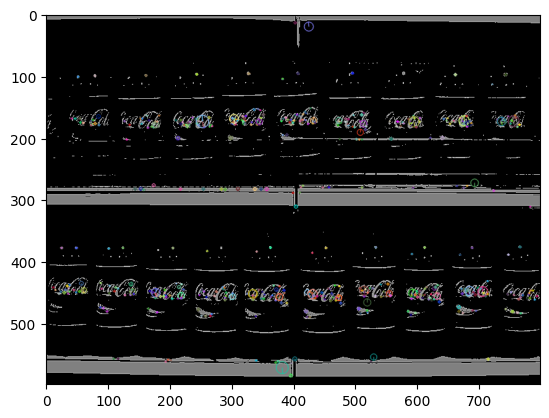

DBSCAN found 27 potential character clusters.
Cluster 0
Too few good matches
Cluster 1
Too few good matches
Cluster 2


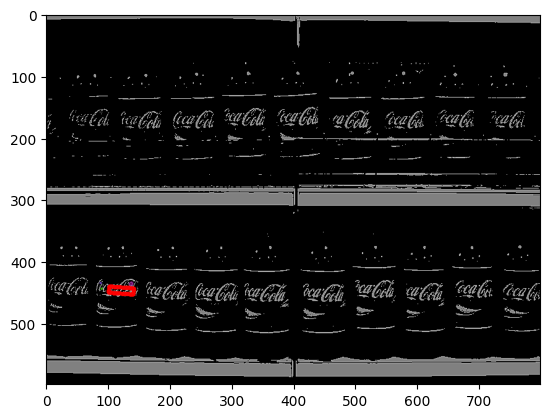

Cluster 3
Too few good matches
Cluster 4


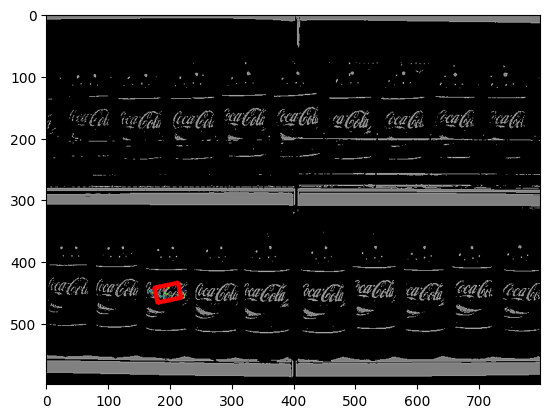

Cluster 5


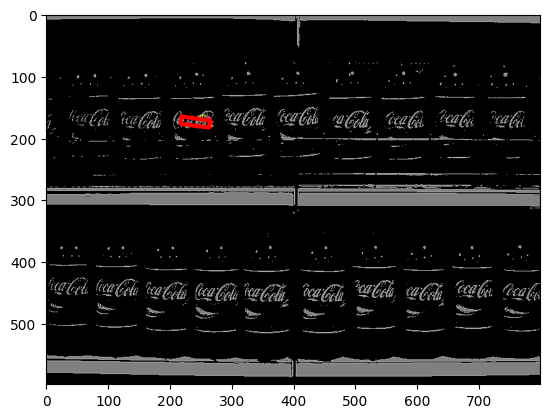

Cluster 6


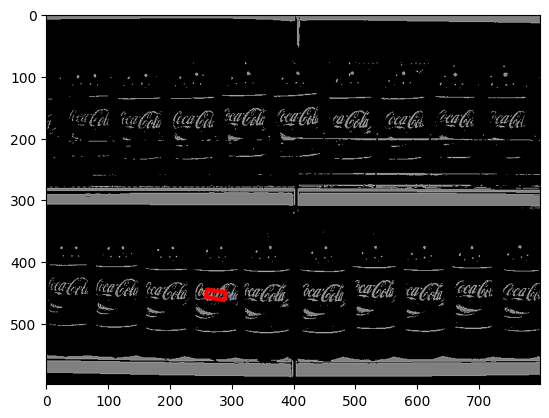

Cluster 7


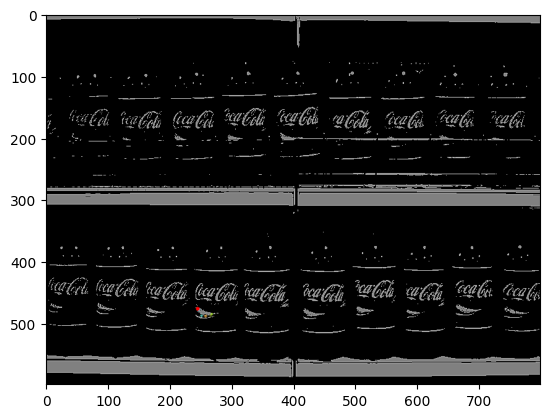

Cluster 8


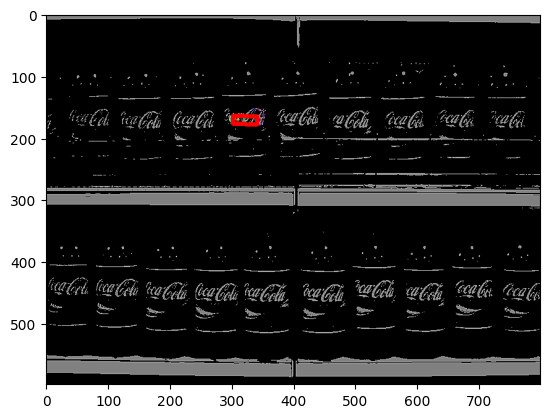

Cluster 9


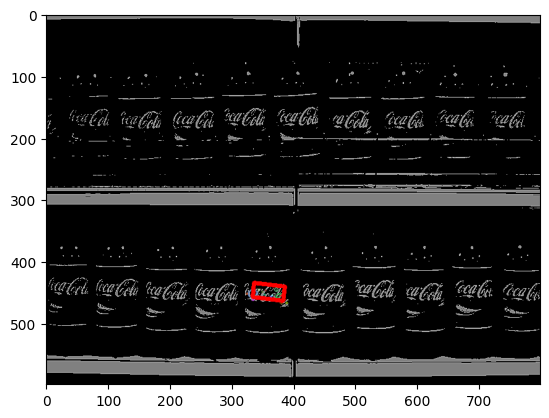

Cluster 10


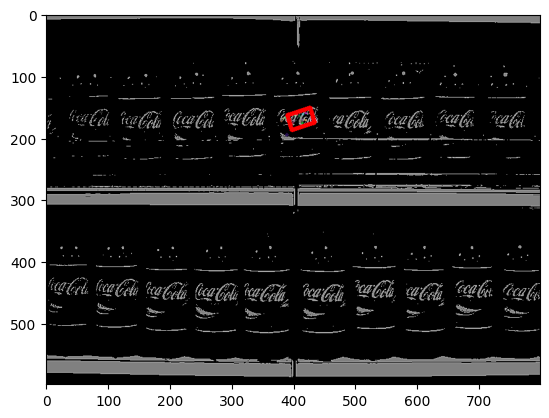

Cluster 11


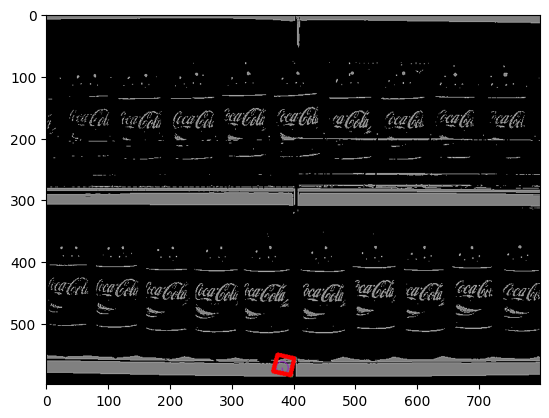

Cluster 12
Too few good matches
Cluster 13


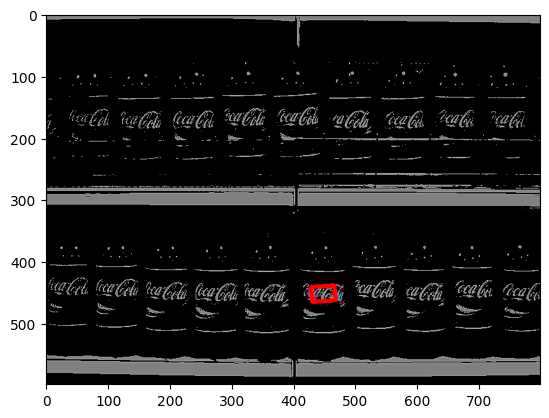

Cluster 14


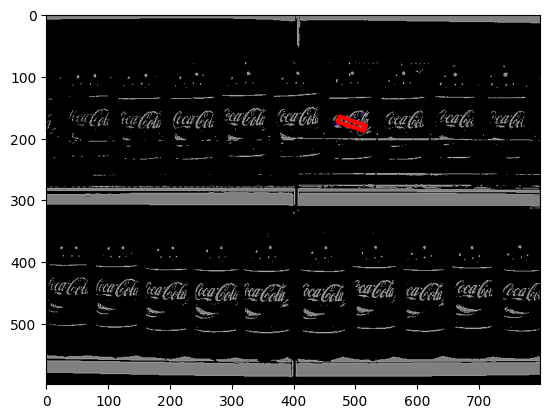

Cluster 15


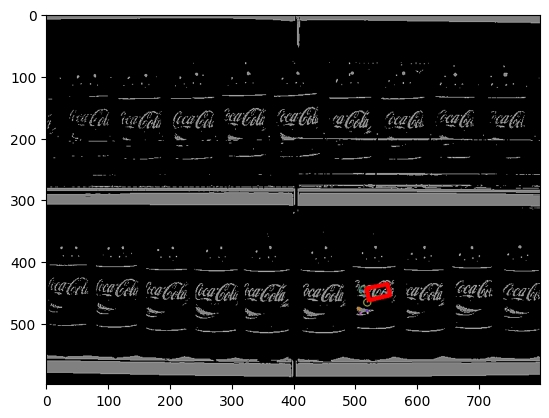

Cluster 16


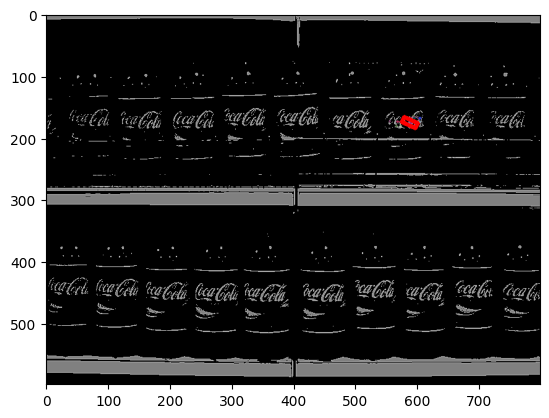

Cluster 17


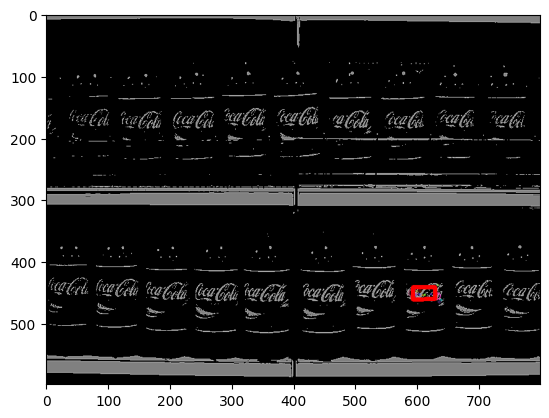

Cluster 18


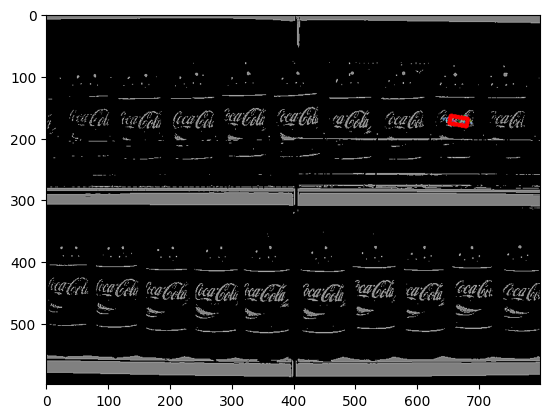

Cluster 19
Too few good matches
Cluster 20


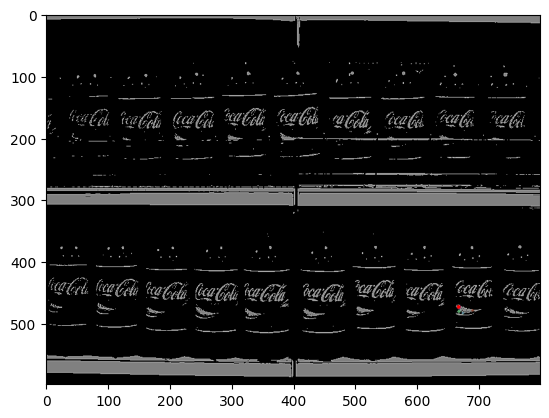

Cluster 21


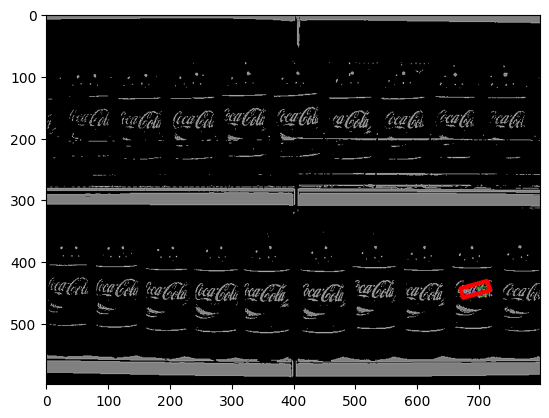

Cluster 22


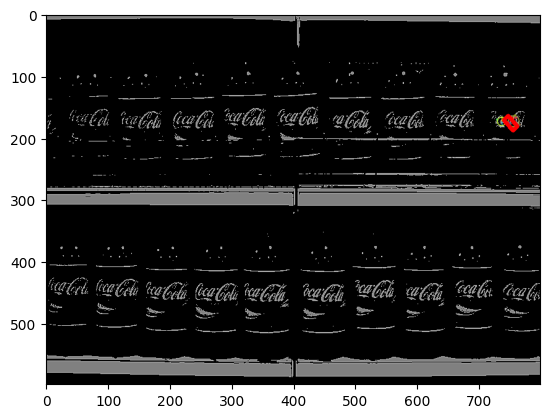

Cluster 23
Too few good matches
Cluster 24
Too few good matches
Cluster 25


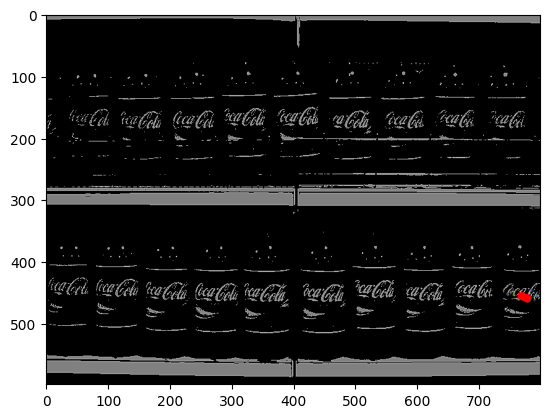

Cluster 26
Too few good matches
Cluster -1


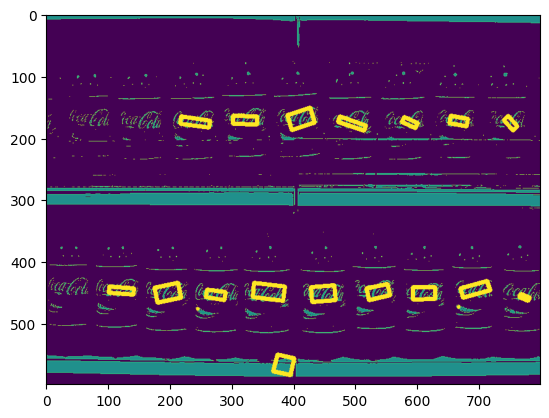

In [68]:
find_multi_image_sift(img1, sharpenning(img2))


(175, 400)


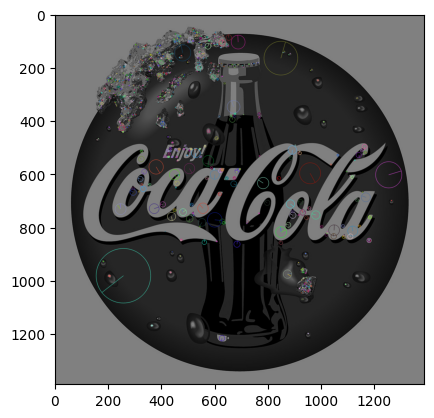

DBSCAN found 26 potential character clusters.
Cluster 0
Too few good matches
Cluster 1
Too few good matches
Cluster 2
Too few good matches
Cluster 3
Too few good matches
Cluster 4


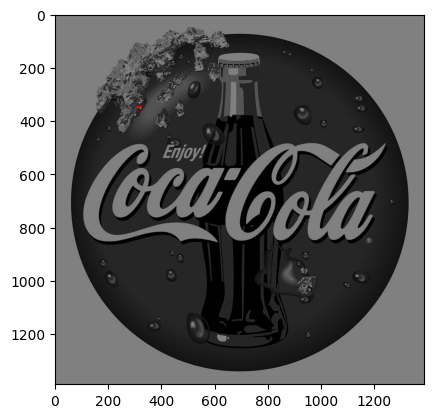

Cluster 5
Too few good matches
Cluster 6
Too few good matches
Cluster 7


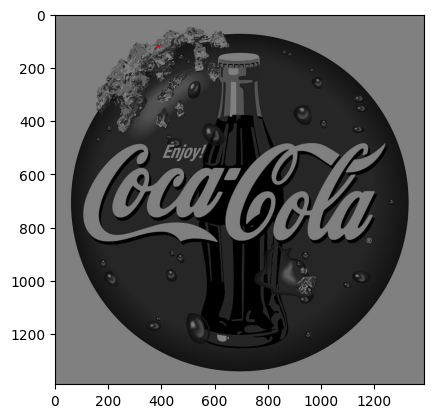

Cluster 8
Too few good matches
Cluster 9
Too few good matches
Cluster 10


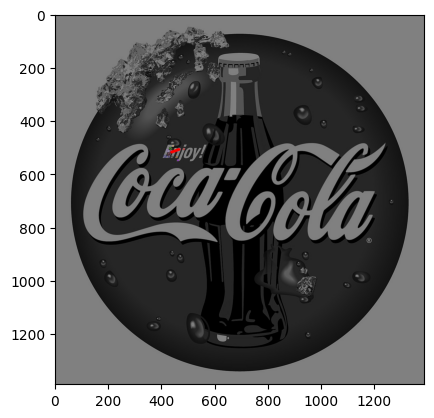

Cluster 11
Too few good matches
Cluster 12
Too few good matches
Cluster 13
Too few good matches
Cluster 14
Too few good matches
Cluster 15


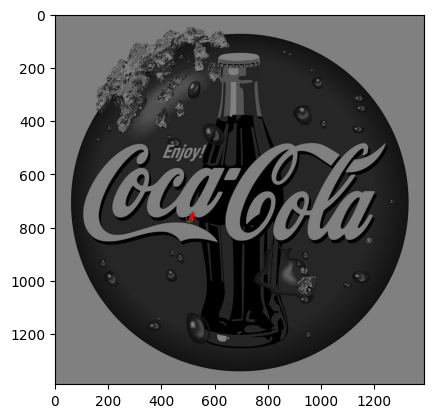

Cluster 16
Too few good matches
Cluster 17
Too few good matches
Cluster 18
Too few good matches
Cluster 19
Too few good matches
Cluster 20
Too few good matches
Cluster 21


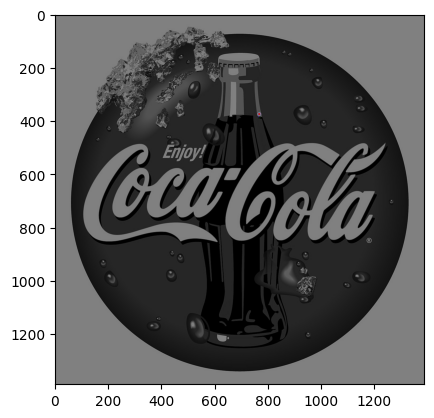

Cluster 22
Too few good matches
Cluster 23
Too few good matches
Cluster 24


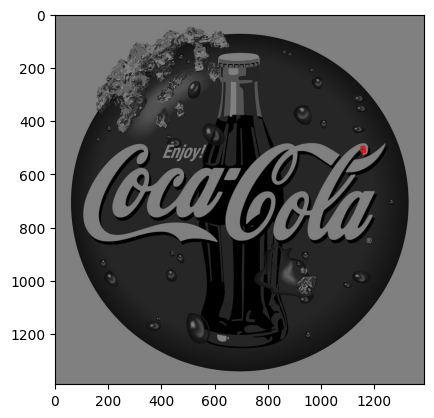

Cluster 25
Too few good matches
Cluster -1


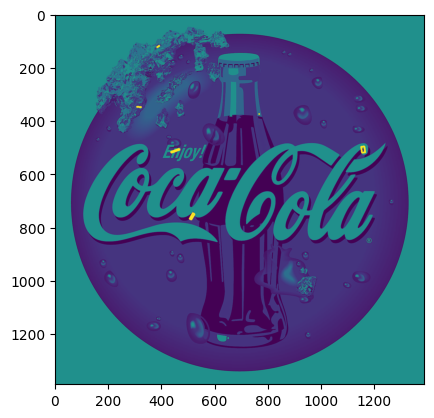

In [74]:
img1 = cv.bitwise_not(cv.imread('./template/pattern.png', cv.IMREAD_GRAYSCALE))
img1 = cv.threshold(img1, 50, 255, cv.THRESH_BINARY)[1]
# img1 = cv.bitwise_not(img1)
print(img1.shape)
img2 = cv.imread('./images/COCA-COLA-LOGO.jpg', cv.IMREAD_GRAYSCALE)

find_multi_image_sift(img1, sharpenning(img2))


COCA-COLA-LOGO.jpg


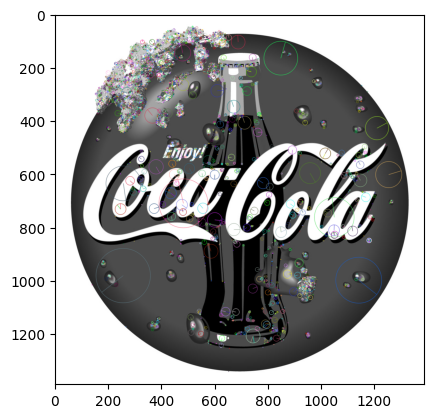

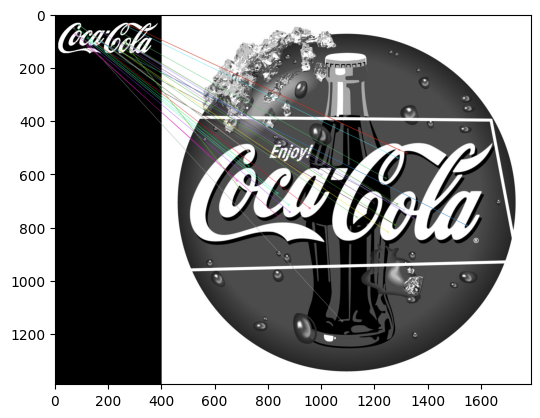

coca_logo_1.png


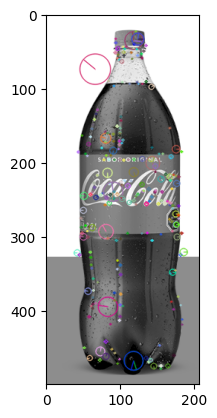

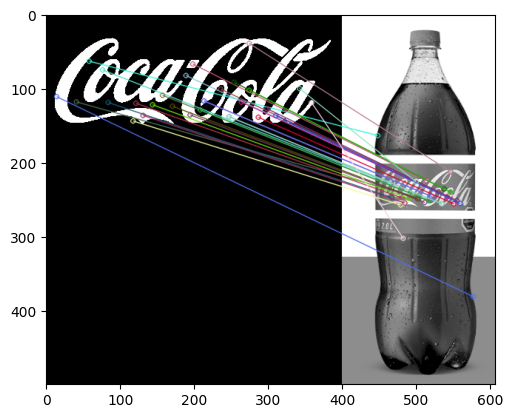

coca_logo_2.png


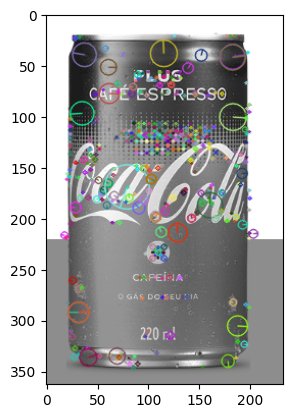

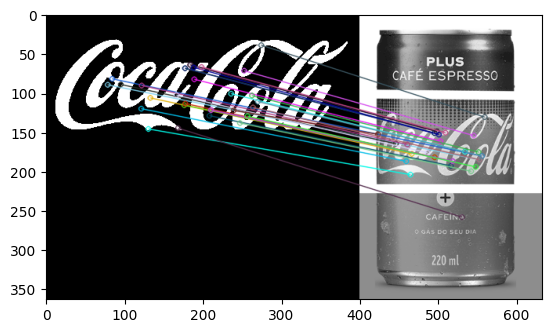

coca_multi.png
too few good points
Reverting template.
too few good points
coca_retro_1.png
too few good points
Reverting template.


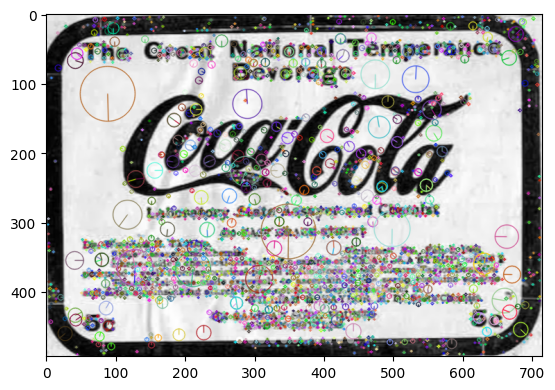

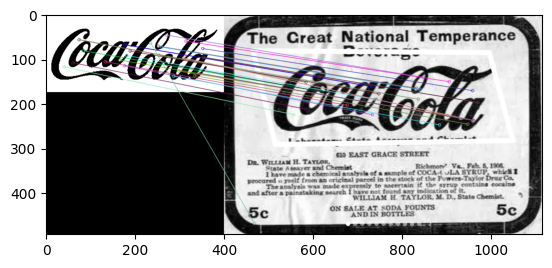

coca_retro_2.png


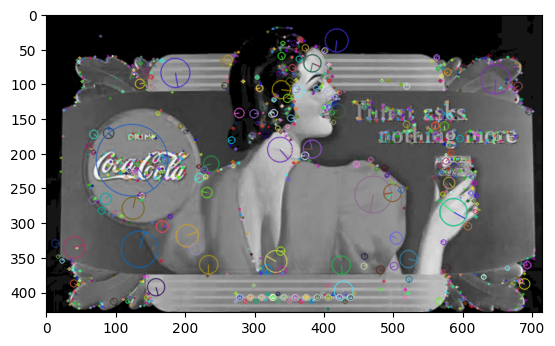

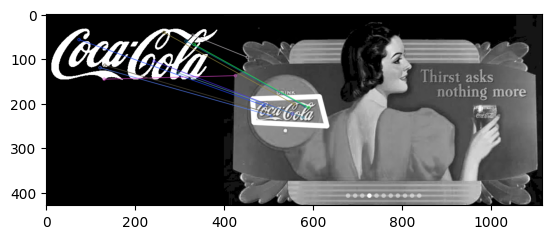

logo_1.png


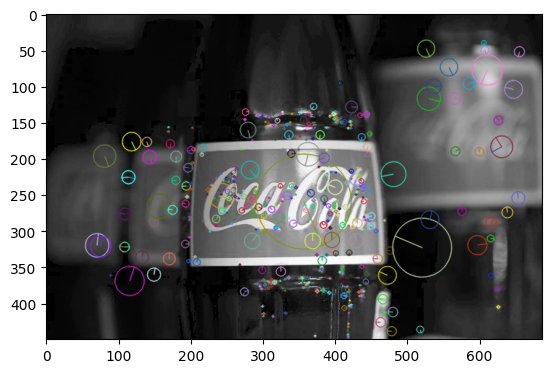

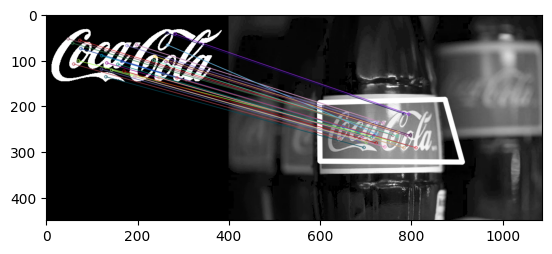

In [73]:
images = filter(lambda filename: 'png' in  filename or 'jpg' in  filename, os.listdir('./images/'))
img1 = cv.bitwise_not(cv.imread('./template/pattern.png', cv.IMREAD_GRAYSCALE))
img1 = cv.threshold(img1, 50, 255, cv.THRESH_BINARY)[1]

for image in images:
    print(image)
    img = cv.imread('./images/' + image, cv.IMREAD_GRAYSCALE)
    if not find_image(img1, img):
        print(f'Reverting template.')
        find_image(cv.bitwise_not(img1), img)

In [ ]:
# sift = cv.xfeatures2d.SIFT_create()
# # img1 = cv.threshold(img1, 50, 255, cv.THRESH_BINARY)[1]
# kp1, des1 = sift.detectAndCompute(img1,None)
# kp2, des2 = sift.detectAndCompute(img2,None)

# FLANN_INDEX_KDTREE = 1
# index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
# search_params = dict(checks=50)

# flann = cv.FlannBasedMatcher(index_params, search_params)
# matches = flann.knnMatch(des1,des2,k=2)
orb = cv.ORB_create()
 
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)

bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key = lambda x:x.distance)


n=60
img3 = cv.drawMatches(img1,kp1,img2,kp2,matches[:n],None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img3)
plt.show()

In [ ]:
import cv2
import numpy as np

# --- DIAGNOSTIC CODE ---

template_path = './template/pattern.png'
scene_path = './images/coca_multi.png'
# img1 = cv.bitwise_not(cv.imread('./template/pattern.png', cv.IMREAD_GRAYSCALE))
# img1 = cv.imread('./template/pattern.png', cv.IMREAD_GRAYSCALE)
# Cargamos la imagen de búsqueda
# img2 = cv.imread('./images/coca_multi.png', cv.IMREAD_GRAYSCALE)
img_template = cv2.bitwise_not(cv2.imread('./template/pattern.png', cv2.IMREAD_GRAYSCALE))

# img_template = cv2.imread(template_path, cv2.IMREAD_GRAYSCALE)
img_scene = cv2.imread(scene_path, cv2.IMREAD_GRAYSCALE)[:300,:110]



# Initialize SIFT
sift = cv2.SIFT_create()
sift = cv2.SIFT_create(nfeatures=0, nOctaveLayers=3, contrastThreshold=0.04, edgeThreshold=10, sigma=1.6)
# Find keypoints
kp_template, des_template = sift.detectAndCompute(img_template, None)
kp_scene, des_scene = sift.detectAndCompute(img_scene, None)

print(f"Keypoints found in template: {len(kp_template)}")
print(f"Keypoints found in scene: {len(kp_scene)}")

# Draw keypoints on the images
img_template_kp = cv2.drawKeypoints(img_template, kp_template, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_scene_kp = cv2.drawKeypoints(img_scene, kp_scene, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display the images with keypoints
cv2.imshow('Template Keypoints', img_template_kp)
cv2.imshow('Scene Keypoints', img_scene_kp)
cv2.waitKey(0)
cv2.destroyAllWindows()

Keypoints found in template: 211
Keypoints found in scene: 282


In [263]:
# --- Apply CLAHE to the scene before SIFT ---
img_scene = cv2.imread(scene_path, cv2.IMREAD_GRAYSCALE)

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
scene_enhanced = clahe.apply(img_scene)

# Now, run SIFT on 'scene_enhanced' instead of 'img_scene'
kp_scene, des_scene = sift.detectAndCompute(scene_enhanced, None)

# Don't forget to draw the keypoints on the enhanced scene to see the difference!
img_scene_kp_enhanced = cv2.drawKeypoints(scene_enhanced, kp_scene, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.imshow('Enhanced Scene Keypoints', img_scene_kp_enhanced)
cv2.waitKey(0)

27

np.float32(0.20695148)

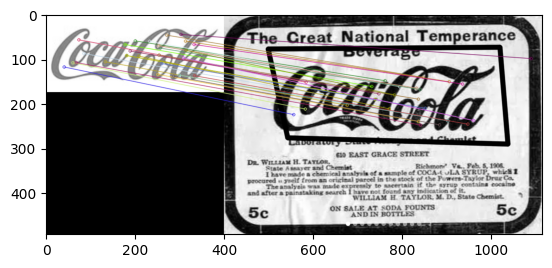

In [149]:

img2 = cv.imread('./images/coca_retro_1.png', cv.IMREAD_GRAYSCALE)
img1 = cv.imread('./template/pattern.png', cv.IMREAD_GRAYSCALE)

find_image(img1, img2)

COCA-COLA-LOGO.jpg


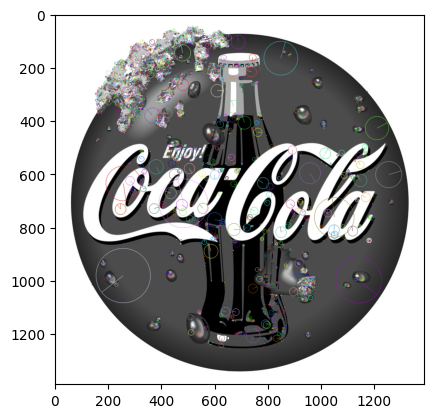

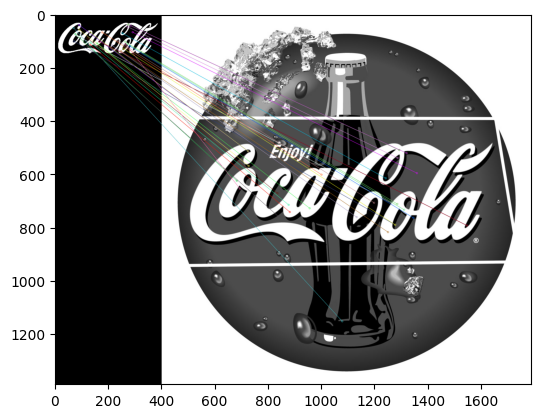

coca_logo_1.png


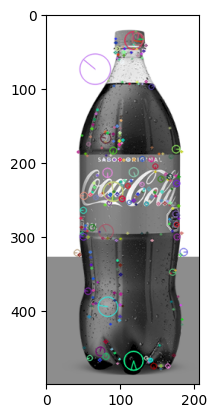

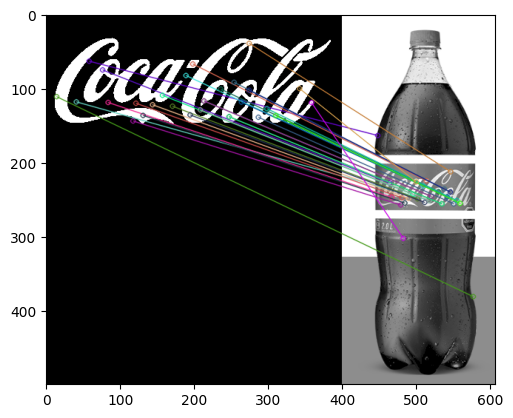

coca_logo_2.png


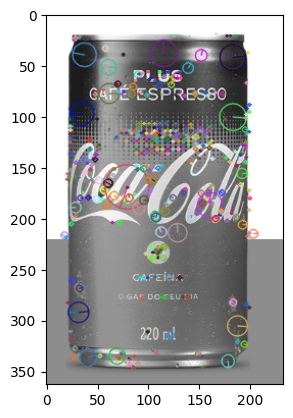

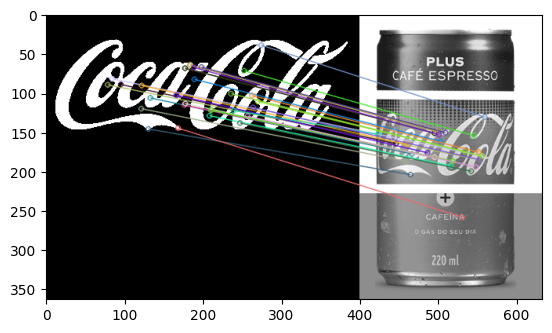

coca_multi.png


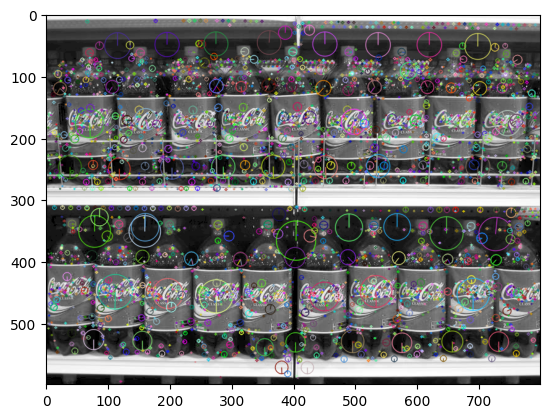

too few good points


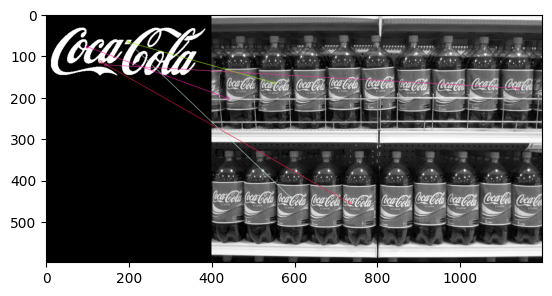

coca_retro_1.png


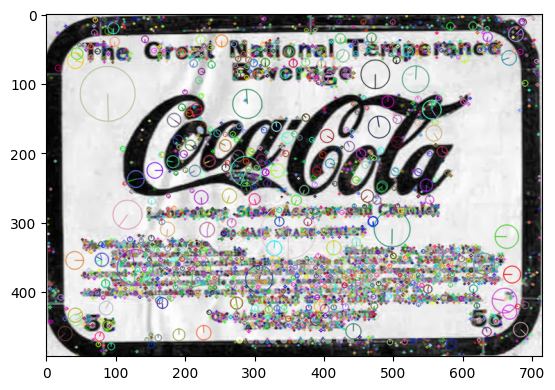

too few good points


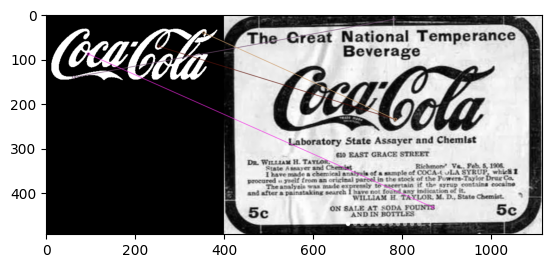

coca_retro_2.png


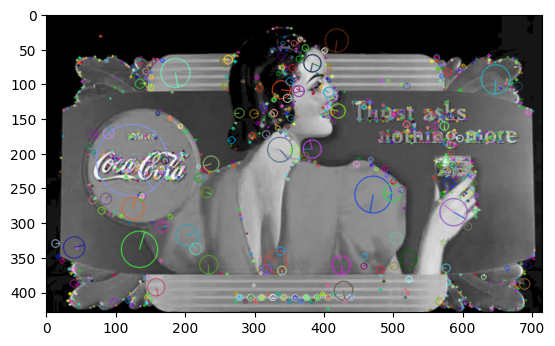

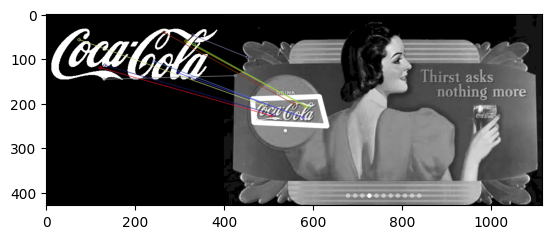

logo_1.png


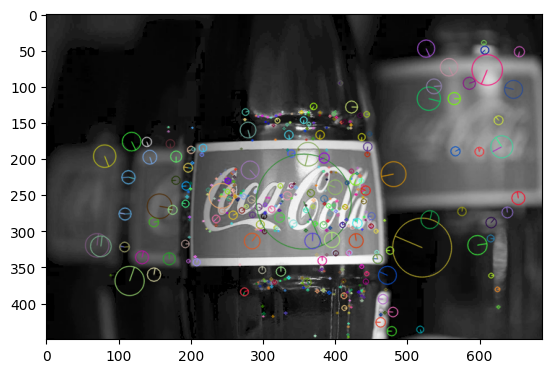

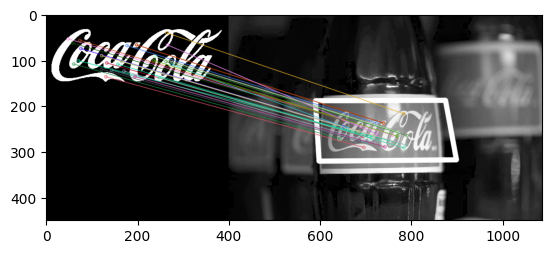

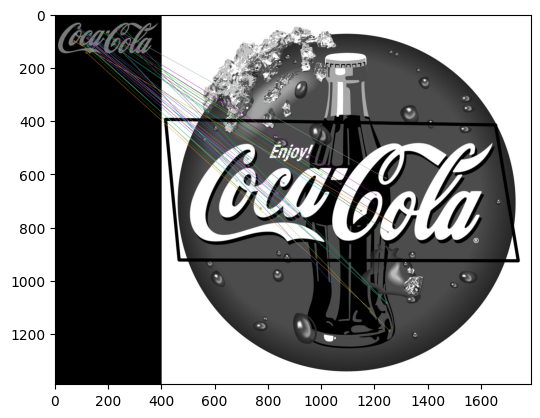

(<matplotlib.image.AxesImage at 0x7ff6aa02f750>, None)

In [103]:
src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
M, mask = cv.findHomography(src_pts, dst_pts, cv.RANSAC, 5.0)
matchesMask = mask.ravel().tolist()
h,w = img1.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst = cv.perspectiveTransform(pts, M)

img2_prime = cv.polylines(img2, [np.int32(dst)], True, 0, 10, cv.LINE_AA)
n=30
img3 = cv.drawMatches(img1,kp1,img2_prime,kp2,good[:n],None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img3), plt.show()


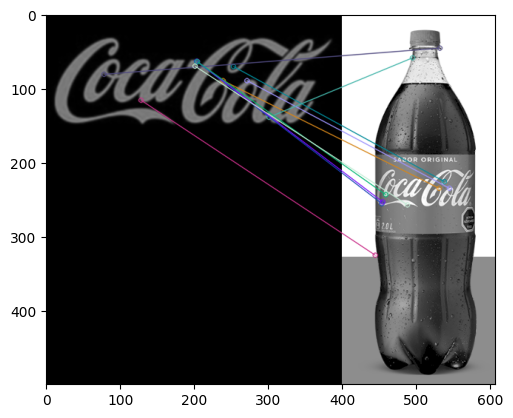

(<matplotlib.image.AxesImage at 0x7ff70c5c1590>, None)

In [21]:
# Cargamos la imagen a buscar
img1 = cv.imread('./template/pattern.png', cv.IMREAD_GRAYSCALE)

img1 = cv.GaussianBlur(img1, (5, 5), 0)
img1 = cv.bitwise_not(img1)

# Cargamos la imagen de búsqueda
img2 = cv.imread('./images/coca_logo_1.png', cv.IMREAD_GRAYSCALE)
orb = cv.ORB_create()
 
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)
bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
# bf = cv.BFMatcher()

matches = bf.match(des1, des2)
matches = sorted(matches, key = lambda x:x.distance)

n=10
img3 = cv.drawMatches(img1,kp1,img2,kp2,matches[:n],None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img3), plt.show()

108
2848


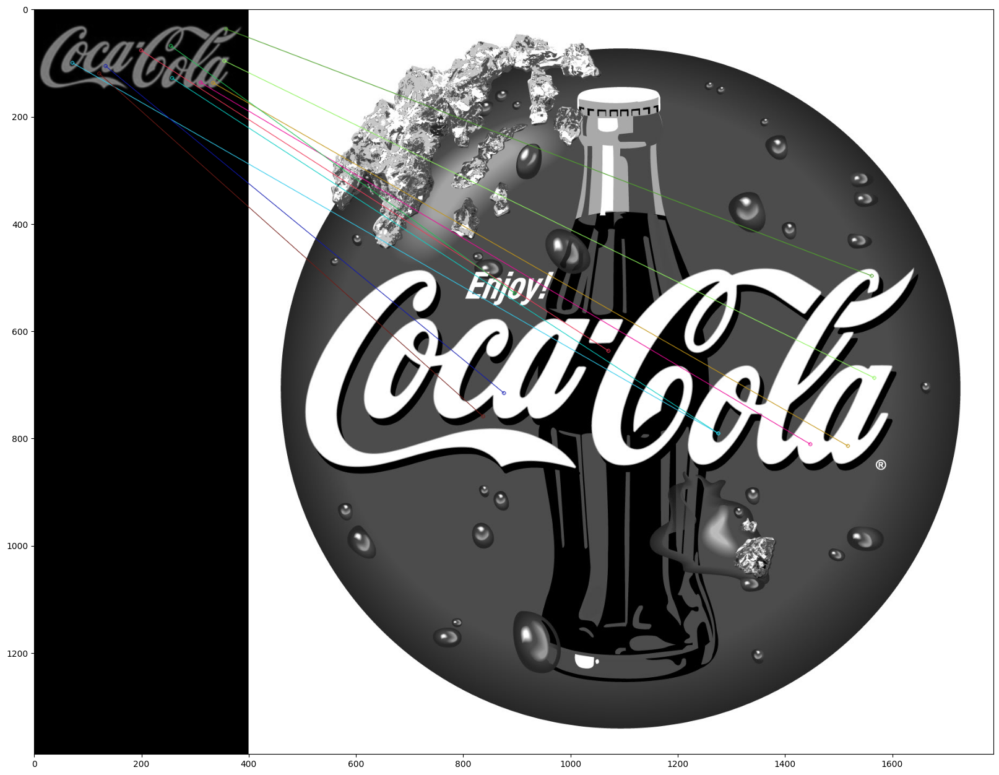

(<matplotlib.image.AxesImage at 0x7ff70c5df390>, None)

In [22]:
# Cargamos la imagen a buscar
img1 = cv.bitwise_not(cv.imread('./template/pattern.png', cv.IMREAD_GRAYSCALE))
img1 = cv.GaussianBlur(img1, (5, 5), 0)
# Cargamos la imagen de búsqueda
img2 = cv.imread('./images/COCA-COLA-LOGO.jpg', cv.IMREAD_GRAYSCALE)

# Creamos el vector de características SIFT
sift = cv.xfeatures2d.SIFT_create()

# Y buscamos según el algoritmo...
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

print(len(kp1))
print(len(kp2))

# BFMatcher con parámetros por defecto
bf = cv.BFMatcher()
# K es la cantidad de "best matches" para cada descriptor
matches = bf.knnMatch(des1, des2, k=2)

# Aplicar test de proporción
good = []
for m, n in matches:
    if m.distance < 0.8*n.distance:
        good.append(m)

# Los ordenamos según distancia
good = sorted(good, key = lambda x:x.distance)
# Dibujamos las primeras N coincidencias (las mejores)
N = 10

# cv.drawMatchesKnn espera una lista de listas como coincidencias
img3 = cv.drawMatchesKnn(img1, kp1, img2, kp2, [good[:N]], None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
#img3 = cv.drawMatchesKnn(img1,kp1,img2,kp2,good,None,flags=cv.DrawMatchesFlags_DEFAULT)
plt.figure(figsize=(20,20))
plt.imshow(img3),plt.show()

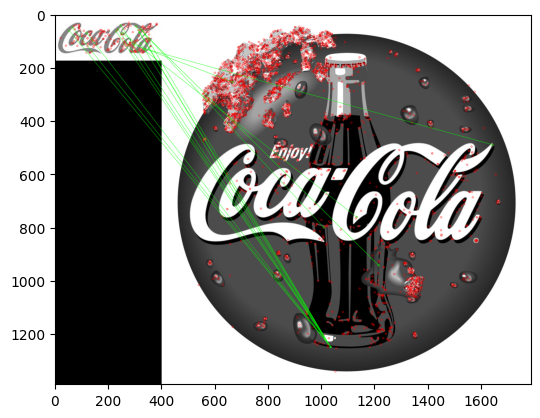

(<matplotlib.image.AxesImage at 0x7ff714436210>, None)

In [5]:
# parámetros FLANN
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)   # o pasar un diccionario vacío
flann = cv.FlannBasedMatcher(index_params,search_params)
# K es la cantidad de "best matches" para cada descriptor
matches = flann.knnMatch(des1, des2, k=2)

# Necesidad de dibujar solo las coincidencias buenas, se crea una máscara
matchesMask = [[0,0] for i in range(len(matches))]

# Ratio de verificación como figura en el paper de Lowe
for i,(m,n) in enumerate(matches):
    if m.distance < 0.7*n.distance:
        matchesMask[i]=[1,0]
draw_params = dict(matchColor = (0,255,0),
                   singlePointColor = (255,0,0),
                   matchesMask = matchesMask,
                   flags = cv.DrawMatchesFlags_DEFAULT)
img3 = cv.drawMatchesKnn(img1,kp1,img2,kp2,matches,None,**draw_params)
plt.imshow(img3,),plt.show()

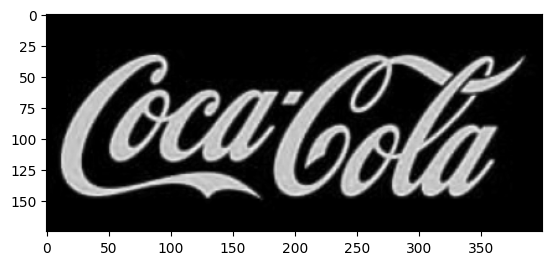

(175, 400)


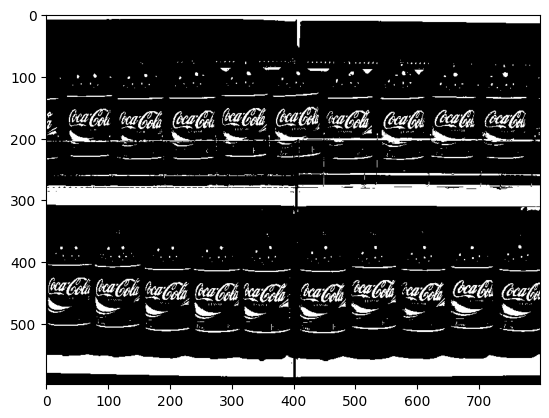

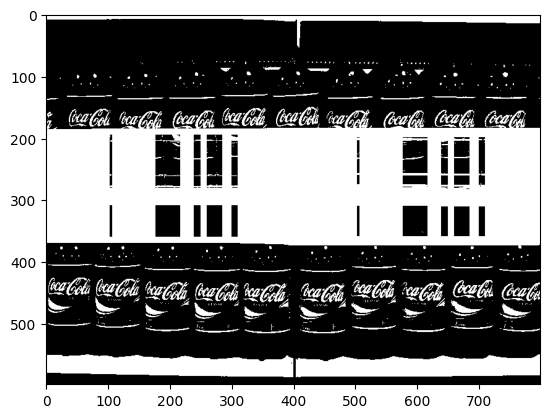

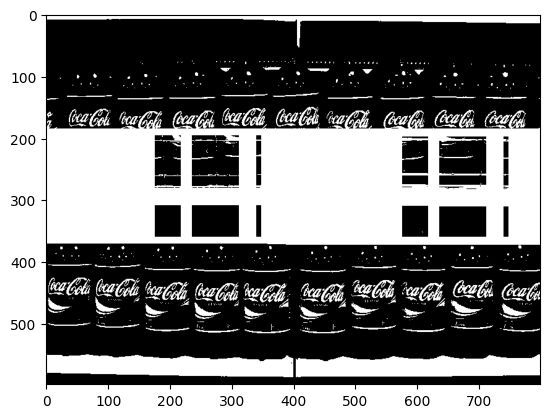

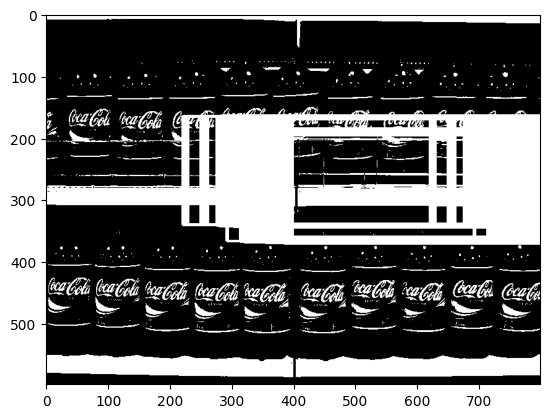

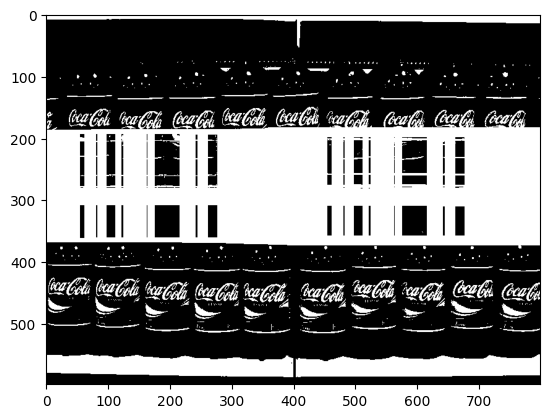

In [58]:
# Cargamos la imagen a buscar
img1 = cv.bitwise_not(cv.imread('./template/pattern.png', cv.IMREAD_GRAYSCALE))
# img1 = cv.threshold(img1, 50, 255, cv.THRESH_BINARY)[1]
# img1 = cv.bitwise_not(img1)

plt.imshow(img1, cmap='gray')
plt.show()
print(img1.shape)
img2 = cv.imread('./images/coca_multi.png', cv.IMREAD_GRAYSCALE)

img2 = cv.threshold(img2, 180, 255, cv.THRESH_BINARY)[1]
plt.imshow(img2, cmap='gray')
plt.show()
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED']
# methods = ['cv.TM_CCOEFF_NORMED']
result = None
for meth in methods:
    output_image = img2.copy()

    method = eval(meth)
    h, w = img1.shape
    result = cv.matchTemplate(img2, img1, method)
    criteria = np.quantile(result, 0.99)
    result = np.where(result>criteria)
    locations = list(zip(*result[::-1]))

    
    
    for top_left in locations:
        bottom_right = (top_left[0] + w, top_left[1] + h)
        cv.rectangle(output_image, top_left, bottom_right, 255, 2) # Red rectangle
    plt.imshow(output_image, cmap='gray')
    plt.show()